In [1]:
import numpy as np
import pandas as pd
data=pd.read_csv("train.csv")
data.head(n=10)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
5,6,0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,NaN,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,NaN,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,NaN,C


In [2]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [6]:
columns_to_drop=["PassengerId","Embarked","Name","Ticket","Cabin"]
data_clean=data.drop(columns_to_drop,axis=1)
data_clean

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare
0,0,3,male,22.0,1,0,7.2500
1,1,1,female,38.0,1,0,71.2833
2,1,3,female,26.0,0,0,7.9250
3,1,1,female,35.0,1,0,53.1000
4,0,3,male,35.0,0,0,8.0500
...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000
887,1,1,female,19.0,0,0,30.0000
888,0,3,female,NaN,1,2,23.4500
889,1,1,male,26.0,0,0,30.0000


In [9]:
from sklearn.preprocessing import LabelEncoder

In [10]:
le=LabelEncoder()

In [11]:
data_clean["Sex"]=le.fit_transform(data_clean["Sex"])

In [12]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    int32  
 3   Age       714 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
dtypes: float64(2), int32(1), int64(4)
memory usage: 45.4 KB


In [13]:
data_clean=data_clean.fillna(data_clean["Age"].mean())

In [14]:
input_cols=["Pclass","Sex","Age","SibSp","Parch","Fare"]

In [15]:
output_cols=["Survived"]

In [16]:
X=data_clean[input_cols]

In [17]:
Y=data_clean[output_cols]

In [18]:
print(X.shape)

(891, 6)


In [19]:
def entropy(col):
    counts=np.unique(col,return_counts=True)
#     print(counts)
    N=float(col.shape[0])
    ent=0.0
    for i in counts[1]:
        p=i/N
        ent+=(-1.0*p*np.log2(p))
        
    return ent;

In [20]:
col=np.array([1,1,1,1,0,1,0])

In [21]:
entropy(col)

0.863120568566631

In [59]:
def divide_data(x_data,fkey,fval):
    x_right=pd.DataFrame([],columns=x_data.columns)
    x_left=pd.DataFrame([],columns=x_data.columns)   
#             x_left=pd.concat([x_left,x_data.loc[i]])
#             x_right=x_right.append(x_data.loc[i])   
#               
    
    for i in range(x_data.shape[0]):
        val=x_data[fkey].loc[i]
        
        if val>fval:
            x_right=x_right.append(x_data.loc[i])  
        else:
            x_left=x_left.append(x_data.loc[i])
            
            
                              
            
    return x_left,x_right;

In [164]:
x_left,x_right=divide_data(data_clean[:10],"Sex",0.5)
# print(x_left)
# print(x_right)

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

In [61]:
def information_gain(x_data,fkey,fval):
    left,right=divide_data(x_data,fkey,fval)
    l=float(left.shape[0])/x_data.shape[0]
    r=float(right.shape[0])/x_data.shape[0]
    
    if left.shape[0]==0 or right.shape[0]==0:
        return -1000000
    i_gain=entropy(x_data.Survived)-(l*entropy(left.Survived)+r*entropy(right.Survived))
    return i_gain

In [62]:
for f in X.columns:
    print(f)
    print(information_gain(data_clean,f,data_clean[f].mean()))

Pclass


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipyker

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

0.07579362743608165
Sex


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

0.2176601066606142
Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

0.0008836151229467681
SibSp


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

0.009584541813400071
Parch


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

0.015380754493137694
Fare


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

0.042140692838995464


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

In [63]:
class DecisionTree:
    
    
    def __init__(self,depth=0,max_depth=5):
        self.left=None
        self.right=None
        self.fkey=None
        self.fval=None
        self.max_depth=max_depth
        self.depth=depth
        self.target=None
        
    def train(self,X_train):
        features=["Pclass","Sex","Age","SibSp","Parch","Fare"]     
        info_gains=[]
        for i in features:
            i_gain=information_gain(X_train,i,X_train[i].mean())
            info_gains.append(i_gain)
            
        self.fkey=features[np.argmax(info_gains)]
        self.fval=X_train[self.fkey].mean()
        print(self.fkey)
        
        
        data_left,data_right=divide_data(X_train,self.fkey,self.fval)
        data_left=data_left.reset_index(drop=True)
        data_right=data_right.reset_index(drop=True)
        
        if data_left.shape[0]==0 or data_right.shape[0]==0:
            if X_train.Survived.mean()>=0.5:
                self.target="Survive"
            else:
                self.target="Dead"
            return
        if(self.depth>=self.max_depth):
            if X_train.Survived.mean()>=0.5:
                self.target="Survive"
            else:
                self.target="Dead"
            return
        self.left=DecisionTree(depth=self.depth+1,max_depth=self.max_depth)
        self.left.train(data_left)
        
        self.right=DecisionTree(depth=self.depth+1,max_depth=self.max_depth)
        self.right.train(data_right)
        
        if X_train.Survived.mean()>=0.5:
            if X_train.Survived.mean()>=0.5:
                self.target="Survive"
            else:
                self.target="Dead"
            return        
            
    def predict(self,test):
        if test[self.fkey]>self.fval:
            if self.right is None:
                return self.target
            return self.right.predict(test)
        else:
            if self.left is None:
                return self.target
            return self.left.predict(test)
    

In [64]:
split=int(0.7*data_clean.shape[0])
train_data=data_clean[:split]
test_data=data_clean[split:]
test_data=test_data.reset_index(drop=True)
print(train_data.shape)

(623, 7)


In [65]:
dt=DecisionTree()

In [66]:
dt.train(train_data)

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

Sex


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

Pclass


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

Age
SibSp


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

Pclass
Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Age
SibSp
Parch
Pclass
SibSp


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Fare
Parch


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Age
Pclass
Age
Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

Parch


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

SibSp
Fare
Age
Age
Fare
Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

Fare
Age
Parch
Fare
Fare
Fare
Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

Fare


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykerne

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Parch


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

Fare


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Age
Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Fare
Fare
SibSp


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Fare
Age
Fare
Pclass
SibSp
Age
Age
Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Pclass
Age
SibSp


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_right=x_right.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18

C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

Fare
SibSp
Age
Parch
SibSp
SibSp
Age
Age
Age
Parch
Age
Age


C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_18732\109537267.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_left=x_left.append(x_data.loc[i])
C:\Users\saksh\AppData\Local\Temp\ipykernel_1873

In [71]:
print(dt.fkey)
print(dt.fval)
print(dt.left.fkey)
print(dt.right.fkey)

Sex
0.6292134831460674
Pclass
Fare


In [72]:
y_pred=[]

In [73]:
for i in range(test_data.shape[0]):
    y_pred.append(dt.predict(test_data.loc[i]))

In [74]:
y_pred

['Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Survive',
 'Dead',
 'Survive',
 'Survive',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Survive',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Survive',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Survive',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'Survive',
 'Dead',
 'Dead',
 'Survive',
 'Dead',
 'Dead',
 'Dead',
 'Survive',
 'De

In [75]:
y_actual=test_data[output_cols]

In [76]:
print(y_actual)

     Survived
0           0
1           0
2           0
3           0
4           1
..        ...
263         0
264         1
265         0
266         1
267         0

[268 rows x 1 columns]


In [77]:
le=LabelEncoder()

In [79]:
y_pred=le.fit_transform(y_pred)

In [80]:
print(y_pred)

[0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 1 1 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0
 1 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0 1 0 1 1 0 0 1 0 0 0
 0 0 0 0 0 0 0 1 1 0 0 0 1 1 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0
 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1
 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 0 1 1 1 1 1 0 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 1 0 0 0 1 1 0
 0 0 0 0 0 1 0 0 0]


In [81]:
y_pred=np.array(y_pred).reshape((-1,1))

In [82]:
print(y_pred.shape)

(268, 1)


In [83]:
acc=np.sum(y_pred==y_actual)/y_pred.shape[0]

In [84]:
print(acc)

Survived    0.817164
dtype: float64


In [132]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [133]:
sktree=DecisionTreeClassifier(criterion="entropy")

In [134]:
sktree.fit(train_data[input_cols],train_data[output_cols])

DecisionTreeClassifier(criterion='entropy')

In [135]:
sktree.predict(test_data[input_cols])

array([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0], dtype=int64)

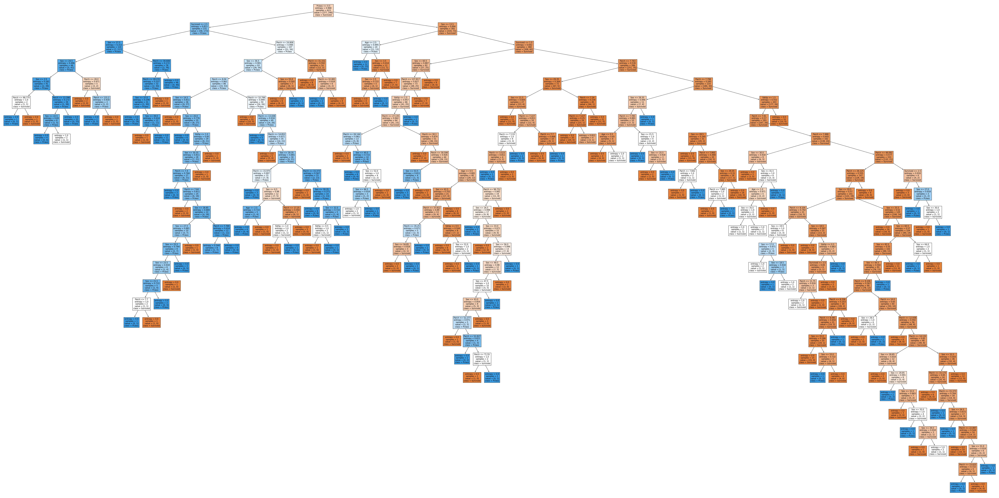

In [162]:
fig = plt.figure(figsize=(100,50))
_ = tree.plot_tree(sktree, 
                   feature_names=train_data.columns,  
                   class_names=test_data.columns,
                   filled=True)

In [163]:
fig.savefig("decistion_tree.png")